# Compare differences between GEBCO versions

https://www.gebco.net/data_and_products/gridded_bathymetry_data/

In [1]:
import cmocean
import warnings
import cartopy.crs as ccrs
from cartopy import feature as cfeature
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from matplotlib import colors

from oceanum.datamesh import Connector

plt.rcParams["figure.figsize"] = [20, 10]
warnings.filterwarnings("ignore")

# Read data

## Connect to datamesh
Define your datamesh token in evironment variables as DATAMESH_TOKEN or insert into argument below.

In [2]:
datamesh = Connector(token=None)

## Read gebco versions

In [3]:
def read_gebco(datasource, xmin, ymin, xmax, ymax):
    """Query gebco data from datamesh."""
    query = {
      "datasource": datasource,
      "geofilter": {"type": "bbox", "geom": [xmin, ymin, xmax, ymax]},
    }
    return datamesh.query(query).load()

In [4]:
gebcos = {}
for year in [2008, 2014, 2019, 2020, 2021, 2022, 2023, 2024]:
    datasource = f"gebco_{year}"
    print(datasource)
    dset = read_gebco(datasource, xmin=165, xmax=180, ymin=-50, ymax=-33)
    gebcos.update({datasource: dset})
dset

gebco_2008
gebco_2014
gebco_2019
gebco_2020
gebco_2021
gebco_2022
gebco_2023
gebco_2024


<xarray.Dataset> Size: 118MB
Dimensions:    (lat: 4080, lon: 3600)
Coordinates:
  * lat        (lat) float64 33kB -50.0 -49.99 -49.99 ... -33.01 -33.01 -33.0
  * lon        (lon) float64 29kB 165.0 165.0 165.0 165.0 ... 180.0 180.0 180.0
Data variables:
    elevation  (lat, lon) float64 118MB -3.623e+03 -3.616e+03 ... -3.122e+03
Attributes: (12/38)
    Conventions:                     CF-1.6, ACDD-1.3
    comment:                         The data in the GEBCO_2024 Grid should n...
    creator_email:                   gdacc@seabed2030.org
    creator_name:                    GEBCO through the Nippon Foundation-GEBC...
    creator_type:                    International organisation
    creator_url:                     https://www.gebco.net
    ...                              ...
    references:                      DOI: 10.5285/1c44ce99-0a0d-5f4f-e063-708...
    source:                          The GEBCO_2024 Grid is the 2024 release ...
    summary:                         The GEBCO_2024 Grid is a continuous, glo...
    title:                           The GEBCO_2024 Grid - a continuous terra...
    _coordinates:                    {"x":"lon","y":"lat"}
    _request_size:                   117565440

# Compare New Zealand

In [6]:
projection = ccrs.TransverseMercator(central_longitude=(float(dset.lon.mean())))
transform = ccrs.PlateCarree()

## Elevations

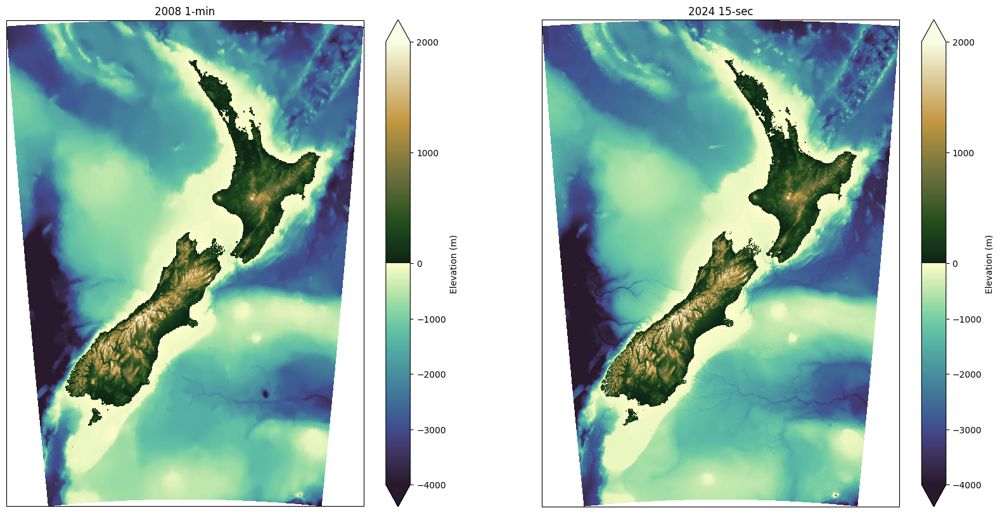

In [7]:
norm = colors.TwoSlopeNorm(vmin=-4000, vmax=2000, vcenter=0)

fig, (ax1, ax2) = plt.subplots(1, 2, subplot_kw={"projection": projection})

# 2008
ds = gebcos["gebco_2008"].elevation.isel(lon=slice(None, None, 2), lat=slice(None, None, 2))
ds.plot(ax=ax1, cmap=cmocean.cm.topo, transform=transform, norm=norm, cbar_kwargs={"label": "Elevation (m)"})
ax1.set_title("2008 1-min")

# 2024
ds = gebcos["gebco_2024"].elevation.isel(lon=slice(None, None, 4), lat=slice(None, None, 4))
ds.plot(ax=ax2, cmap=cmocean.cm.topo, transform=transform, norm=norm, cbar_kwargs={"label": "Elevation (m)"})
ax2.set_title("2024 15-sec");

## Differences

In [8]:
def plot_difference(datasource1, datasource2, levels=[-500], step=1, vmax1=100, vmax2=10, figsize=None):
    """Plot absolute and percentage differences between 2 grids."""

    ds1 = gebcos[datasource1].elevation
    ds2 = gebcos[datasource2].elevation

    if ds1.shape != ds2.shape:
        ds2 = ds2.interp_like(ds1)

    # Downsampling
    ds1 = ds1.isel(lon=slice(None, None, step), lat=slice(None, None, step))
    ds2 = ds2.isel(lon=slice(None, None, step), lat=slice(None, None, step))

    xmin, xmax = ds1.lon.values[[0, -1]]
    ymin, ymax = ds1.lat.values[[0, -1]]

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize, subplot_kw={"projection": projection})

    # Absolute difference
    ds = ds2 - ds1
    ds.plot(ax=ax1, vmin=-vmax1, vmax=vmax1, cmap="RdBu_r", transform=transform, cbar_kwargs={"label": "Absolute difference (m)"});
    levs = np.arange(-100, 110, 10)
    c = ds2.plot.contour(ax=ax1, colors="gray", linewidths=1, linestyles="-", levels=levels, transform=transform)
    c.clabel(fmt="%0.0f m", fontsize=8)
    ax1.coastlines(linewidth=2)
    ax1.set_title("Absolute")
    ax1.set_extent([xmin, xmax, ymin, ymax])

    # Percentage difference
    ds = 100 * (ds2 - ds1) / ds1
    ds.plot(ax=ax2, vmin=-vmax2, vmax=vmax2, cmap="RdBu_r", transform=transform, cbar_kwargs={"label": "Percentage difference (%)"});
    levs = np.arange(-10, 11, 1)
    c = ds2.plot.contour(ax=ax2, colors="gray", linewidths=1, linestyles="-", levels=levels, transform=transform)
    c.clabel(fmt="%0.0f m", fontsize=8)
    ax2.coastlines(linewidth=2)
    ax2.set_title("Percentage")
    ax2.set_extent([xmin, xmax, ymin, ymax])

### 2008 vs 2024

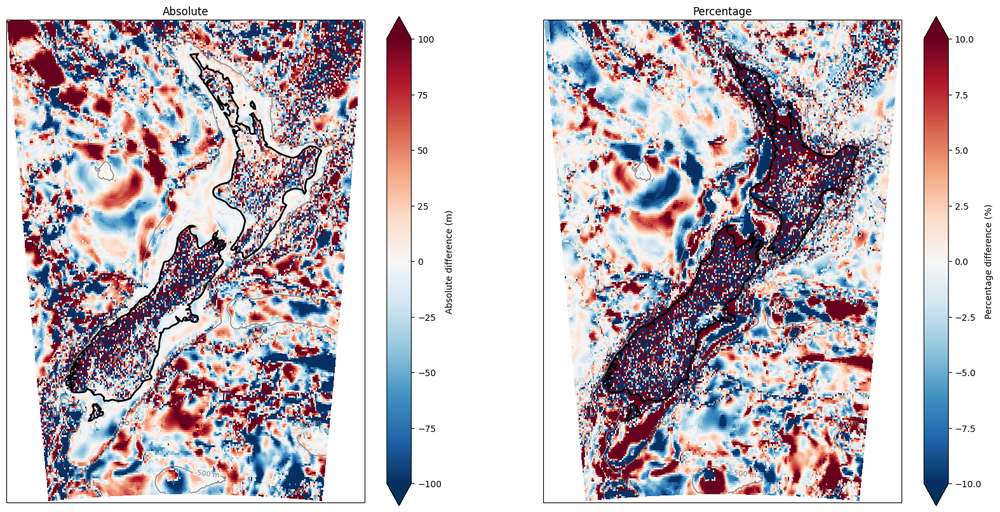

In [18]:
plot_difference("gebco_2008", "gebco_2024", step=4)

### 2008 vs 2014

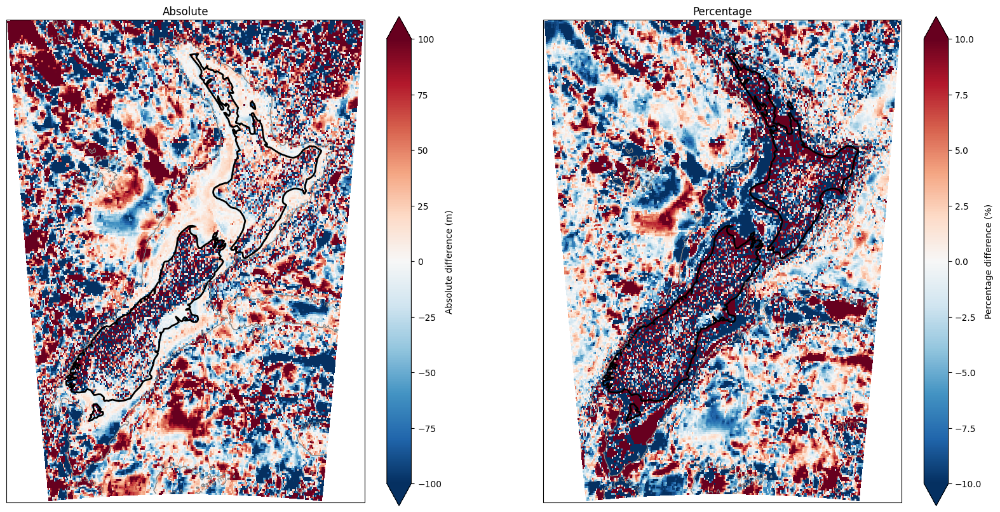

In [19]:
plot_difference("gebco_2008", "gebco_2014", step=4)

### 2014 vs 2019

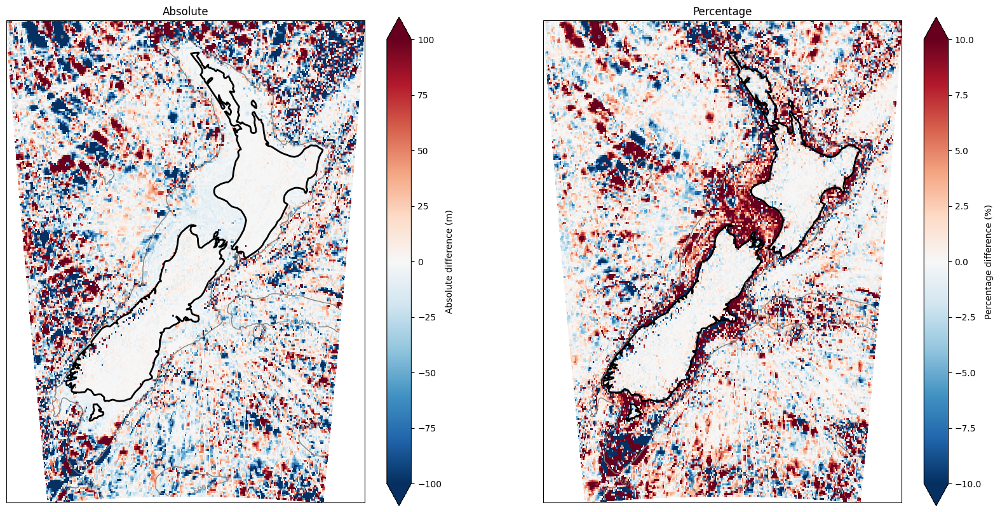

In [20]:
plot_difference("gebco_2014", "gebco_2019", step=8)

### 2019 vs 2020

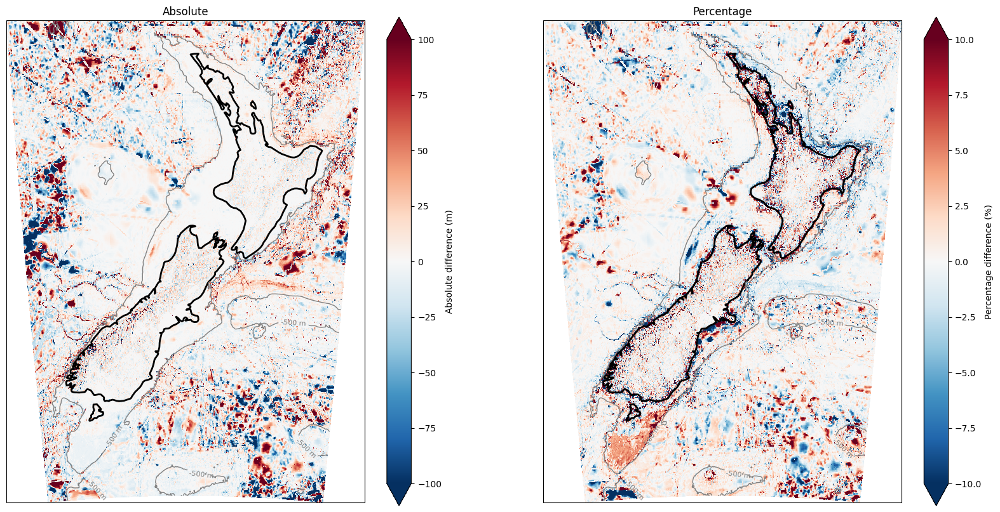

In [21]:
plot_difference("gebco_2019", "gebco_2020", step=8)

### 2020 vs 2021

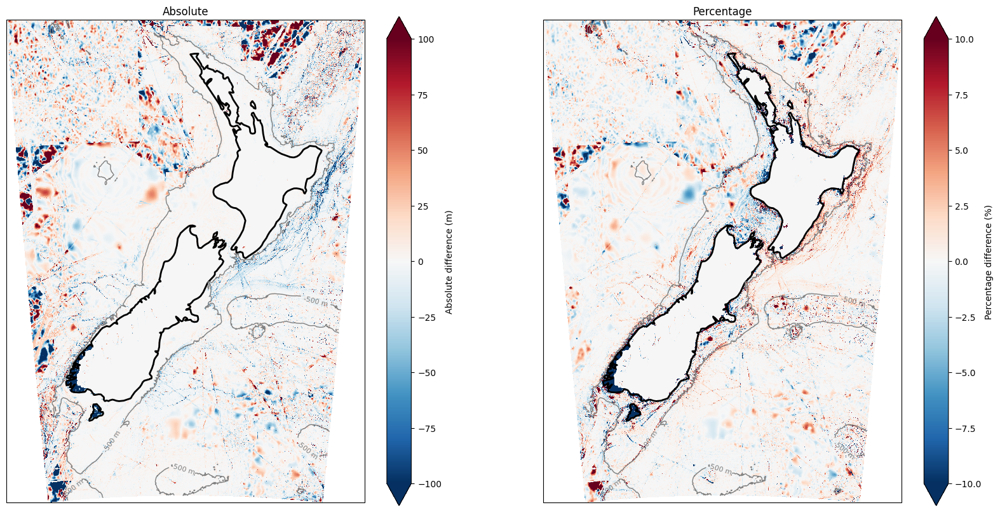

In [13]:
plot_difference("gebco_2020", "gebco_2021", step=4)

### 2021 vs 2022

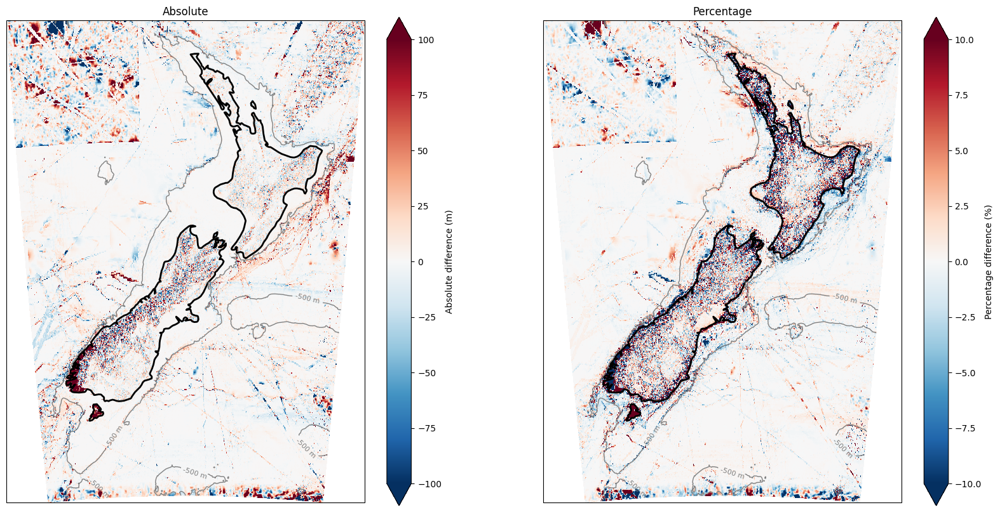

In [22]:
plot_difference("gebco_2021", "gebco_2022", step=8)

### 2022 vs 2023

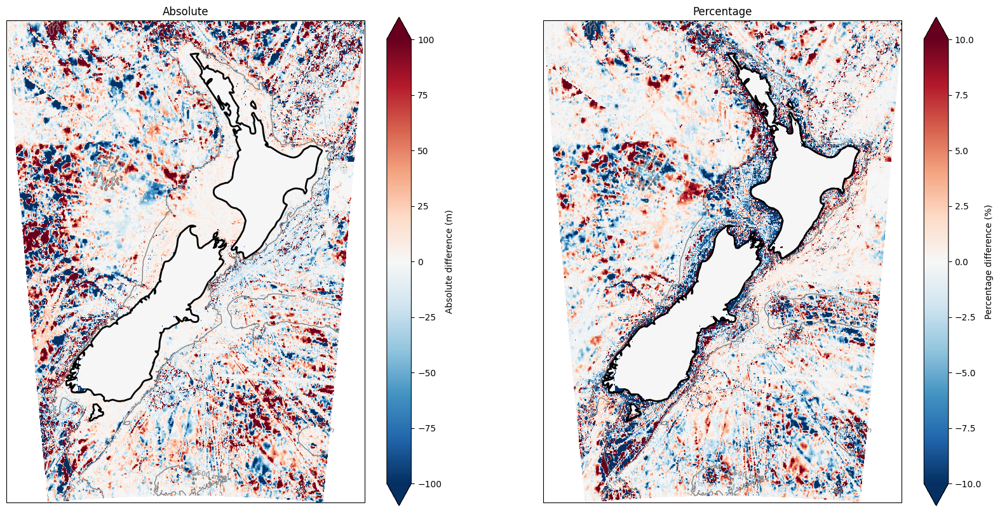

In [23]:
plot_difference("gebco_2022", "gebco_2023", step=8)

### 2023 vs 2024

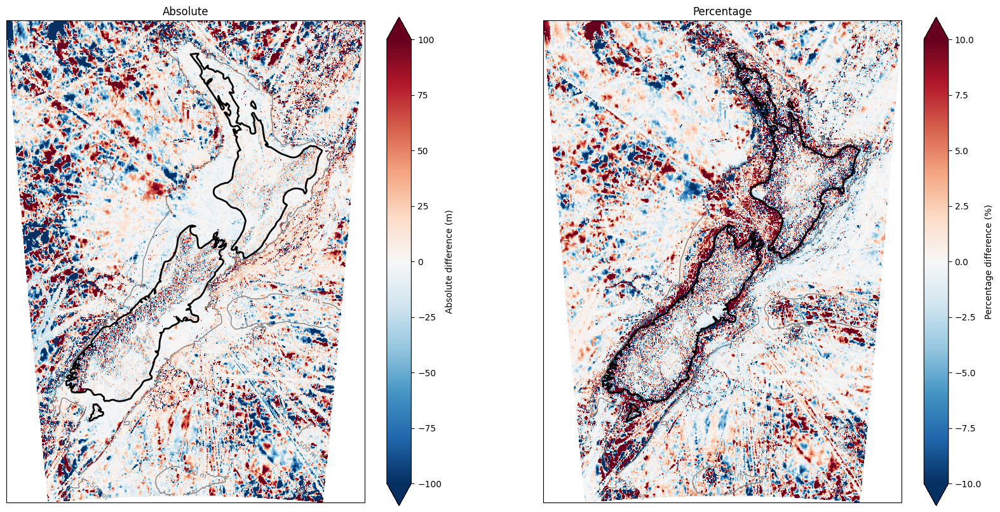

In [24]:
plot_difference("gebco_2023", "gebco_2024", step=8)

# Western Europe

In [26]:
gebcos = {}
for year in [2008, 2023, 2024]:
    datasource = f"gebco_{year}"
    print(datasource)
    dset = read_gebco(datasource, xmin=-11, xmax=13, ymin=48.5, ymax=61)
    gebcos.update({datasource: dset})
dset

gebco_2008
gebco_2023
gebco_2024


<xarray.Dataset> Size: 138MB
Dimensions:    (lat: 3000, lon: 5760)
Coordinates:
  * lat        (lat) float64 24kB 48.5 48.51 48.51 48.51 ... 60.99 60.99 61.0
  * lon        (lon) float64 46kB -11.0 -10.99 -10.99 ... 12.99 12.99 13.0
Data variables:
    elevation  (lat, lon) float64 138MB -2.547e+03 -2.469e+03 ... 600.0 609.0
Attributes: (12/38)
    Conventions:                     CF-1.6, ACDD-1.3
    comment:                         The data in the GEBCO_2024 Grid should n...
    creator_email:                   gdacc@seabed2030.org
    creator_name:                    GEBCO through the Nippon Foundation-GEBC...
    creator_type:                    International organisation
    creator_url:                     https://www.gebco.net
    ...                              ...
    references:                      DOI: 10.5285/1c44ce99-0a0d-5f4f-e063-708...
    source:                          The GEBCO_2024 Grid is the 2024 release ...
    summary:                         The GEBCO_2024 Grid is a continuous, glo...
    title:                           The GEBCO_2024 Grid - a continuous terra...
    _coordinates:                    {"x":"lon","y":"lat"}
    _request_size:                   138310080

In [27]:
projection = ccrs.TransverseMercator(central_longitude=(float(dset.lon.mean())))
transform = ccrs.PlateCarree()

### 2008 vs 2024

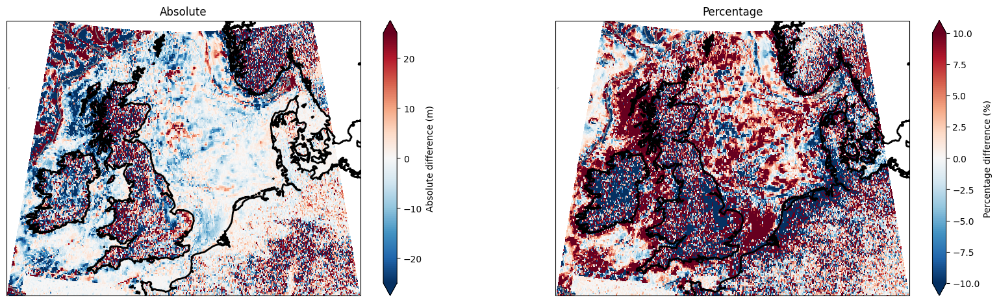

In [28]:
plot_difference("gebco_2008", "gebco_2024", step=4, vmax1=25, figsize=(20, 5.5))

### 2023 vs 2024

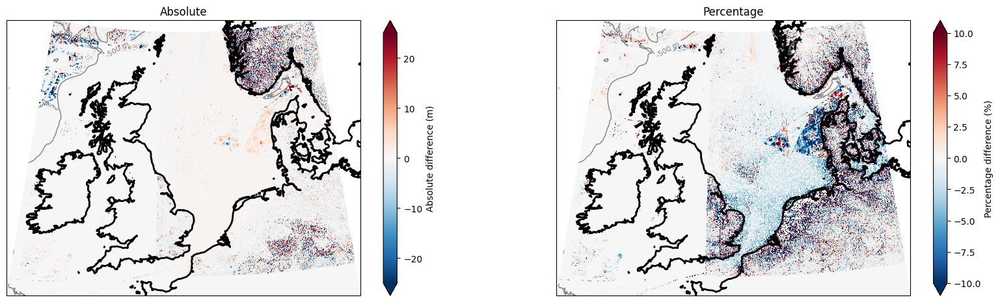

In [29]:
plot_difference("gebco_2023", "gebco_2024", step=8, vmax1=25, figsize=(20, 5.5))